In [2]:
import pyshtools
import numpy as np 
from sh_utils import compute_background
from PIL import Image
import skimage
#01000/01237
from sphere_helper import drawSphere, drawMap
import torch

In [3]:
filenames = [
    "01000/01237",
    "00000/00700",
    "00000/00495",
    "01000/01923",
    "01000/01133",
    "00000/00715",
    "00000/00497",
    "00000/00644",
    "00000/00554",
    "01000/01173"
]
DATASET_DIR = "../../datasets/face/face2000_single/"

In [4]:
def generate_face(filenames):
    for fname in filenames:
        source_image = skimage.io.imread(f"{DATASET_DIR}/images/{fname}.png")
        source_image = skimage.transform.resize(source_image, (256, 256))
        if source_image.shape[2] == 4:
            source_image = skimage.color.rgba2rgb(source_image)
        sh_coeff = np.load(f"{DATASET_DIR}/light/{fname}_light.npy")
        sh_coeff[0,:] = 0
        sh_coeff[4:,:] = 0
        envmap = drawMap(torch.tensor(sh_coeff), img_size=256)[0].permute(1, 2, 0).numpy()
        sphere_front = drawSphere(torch.tensor(sh_coeff))
        sphere_front = sphere_front.permute(1, 2, 0).numpy()
        sphere_back = drawSphere(torch.tensor(sh_coeff), is_back=True)
        sphere_back = sphere_back.permute(1, 2, 0).numpy()
        image = np.concatenate([source_image, sphere_front, sphere_back, envmap], axis=1)
        image = skimage.img_as_ubyte(image)
        img = Image.fromarray(image)
        print(f"{fname}.png")
        gray_coeff = 0.299 * sh_coeff[:,0] + 0.587 * sh_coeff[:,1] + 0.114 * sh_coeff[:,2]
        print(f"X: {gray_coeff[1]}, Y: {gray_coeff[2]}, Z: {gray_coeff[3]}")
        print(f"X: {sh_coeff[1]}, Y: {sh_coeff[2]}, Z: {sh_coeff[3]}")
        display(img)

# X-minus

01000/01237.png
X: -0.8282173871994019, Y: -0.12850742042064667, Z: -0.2952864170074463
X: [-0.78983754 -0.8421094  -0.8573483 ], Y: [-0.1188852  -0.13204731 -0.13551736], Z: [-0.28621444 -0.29755712 -0.3073886 ]


/home/vll/venv_pytorch2.0/lib/python3.11/site-packages/torch/functional.py:504: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3483.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


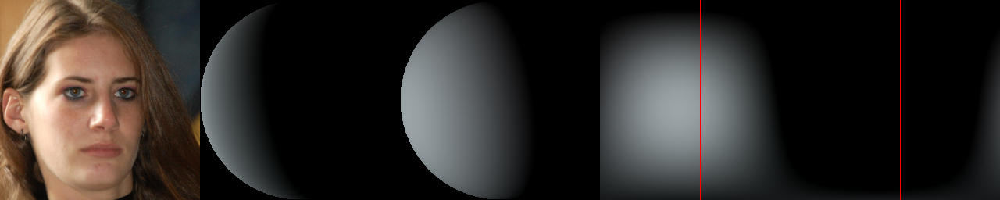

00000/00700.png
X: -0.735832929611206, Y: -0.08116940408945084, Z: -0.25289440155029297
X: [-0.69318587 -0.75148475 -0.7670953 ], Y: [-0.08375859 -0.08018731 -0.07943537], Z: [-0.26954746 -0.2467401  -0.24090578]


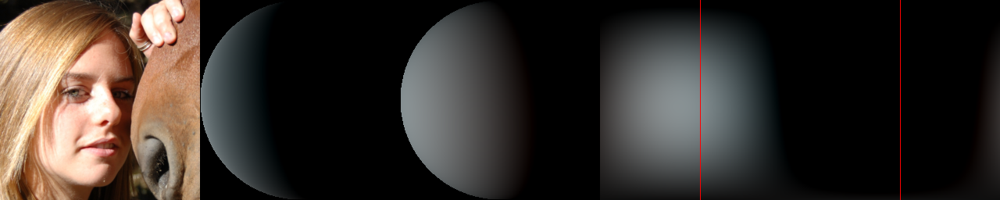

00000/00495.png
X: -0.7159397602081299, Y: -0.03257191181182861, Z: -0.5010008811950684
X: [-0.7012275  -0.72220963 -0.72224325], Y: [-0.03339508 -0.03249204 -0.03082418], Z: [-0.48724917 -0.51069224 -0.48716688]


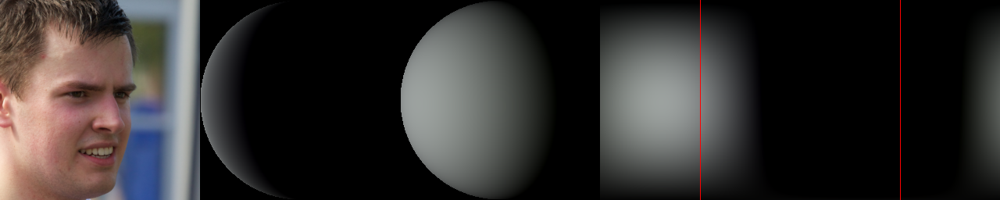

01000/01923.png
X: -0.7051969766616821, Y: 0.03108213096857071, Z: -0.5447669625282288
X: [-0.7112441  -0.70363283 -0.69739026], Y: [0.02830341 0.03172576 0.03505603], Z: [-0.5455967  -0.55083126 -0.5113652 ]


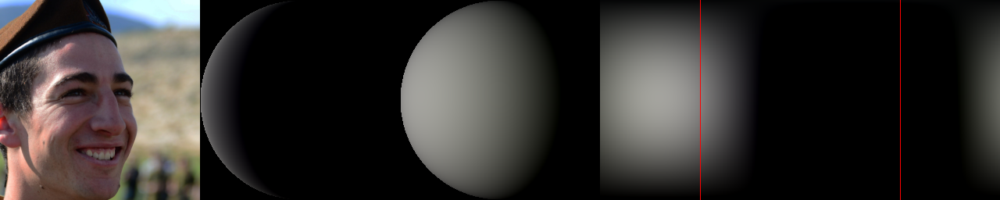

01000/01133.png
X: -0.6605573296546936, Y: 0.12402134388685226, Z: -0.5489382147789001
X: [-0.6506911 -0.6650803 -0.663145 ], Y: [0.12866117 0.1221626  0.1214228 ], Z: [-0.52528536 -0.55460936 -0.58177334]


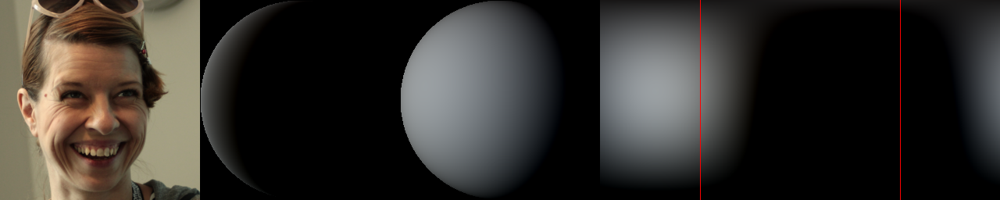

00000/00715.png
X: -0.6438584327697754, Y: -0.05406230315566063, Z: -0.42097556591033936
X: [-0.58133274 -0.6691127  -0.67781436], Y: [-0.05868746 -0.05167591 -0.05421925], Z: [-0.3795503  -0.43676293 -0.44833487]


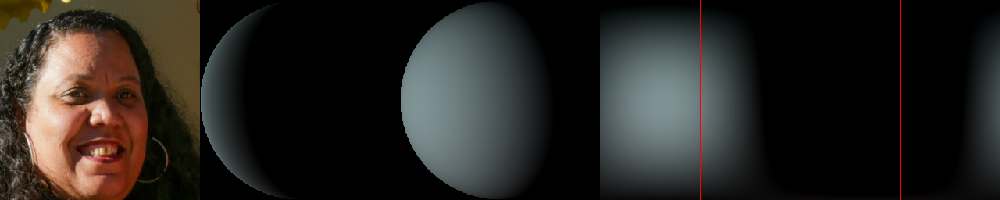

00000/00497.png
X: -0.6387103796005249, Y: 0.1079624742269516, Z: -0.3966069519519806
X: [-0.6084319  -0.65102106 -0.6547363 ], Y: [0.09849769 0.1114786  0.11468185], Z: [-0.39871588 -0.39978427 -0.37471533]


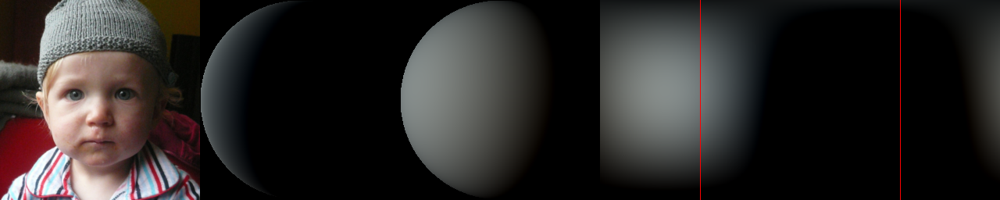

00000/00644.png
X: -0.6031055450439453, Y: -0.009137431159615517, Z: -0.6696485280990601
X: [-0.5973915  -0.6061331  -0.60250294], Y: [-0.00992578 -0.00826097 -0.01158273], Z: [-0.65615416 -0.6762453  -0.67107415]


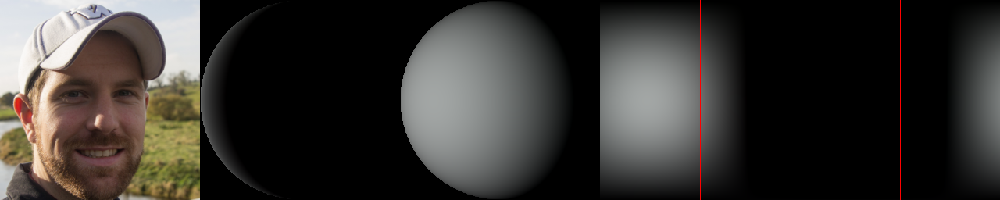

00000/00554.png
X: -0.576209545135498, Y: -0.20396047830581665, Z: -0.47354912757873535
X: [-0.53121173 -0.5943031  -0.6010644 ], Y: [-0.20192687 -0.20395036 -0.20934634], Z: [-0.4412863  -0.48967367 -0.47514093]


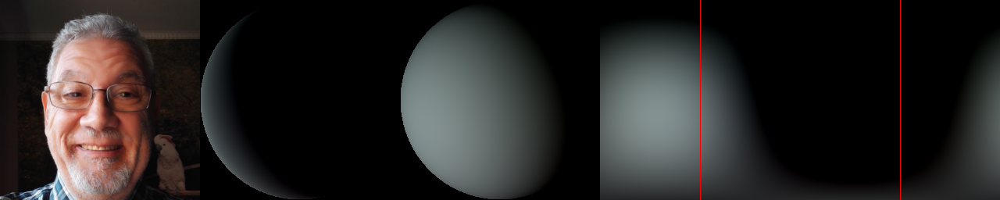

01000/01173.png
X: -0.5706204175949097, Y: 0.09079378098249435, Z: -0.3724214732646942
X: [-0.5290982  -0.5845889  -0.60760003], Y: [0.0898806  0.09202328 0.08685803], Z: [-0.39160737 -0.37296605 -0.3192963 ]


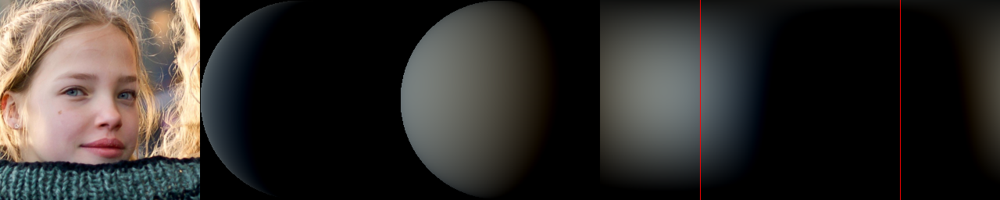

In [5]:
filenames = [
    "01000/01237",
    "00000/00700",
    "00000/00495",
    "01000/01923",
    "01000/01133",
    "00000/00715",
    "00000/00497",
    "00000/00644",
    "00000/00554",
    "01000/01173"
]
generate_face(filenames)

# X - Plus

01000/01425.png
X: 1.066262125968933, Y: 0.05783894658088684, Z: -0.6739702820777893
X: [1.0333625 1.0764107 1.1002958], Y: [0.05254738 0.06043906 0.05832943], Z: [-0.631297   -0.68844527 -0.7113605 ]


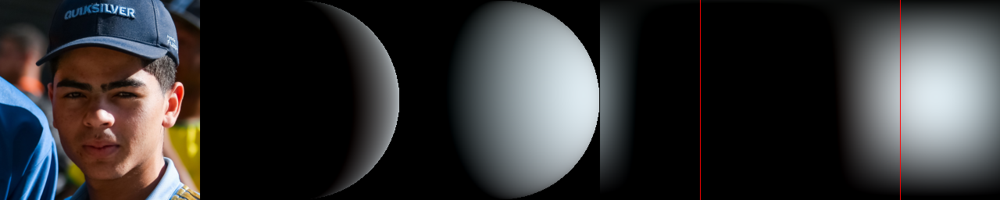

00000/00321.png
X: 0.9478649497032166, Y: -0.022461147978901863, Z: -0.4644191861152649
X: [0.9162791 0.9573004 0.9821241], Y: [-0.02922234 -0.02141795 -0.01009941], Z: [-0.45232525 -0.46250504 -0.50599533]


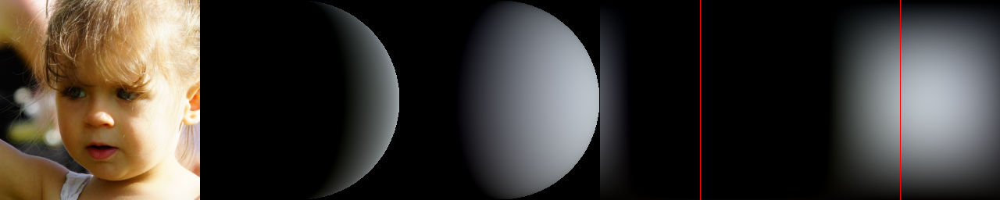

01000/01501.png
X: 0.884147047996521, Y: -0.02250022627413273, Z: -0.45842689275741577
X: [0.85536426 0.89491504 0.9041931 ], Y: [-0.0185347  -0.02424502 -0.02391689], Z: [-0.40332183 -0.48106718 -0.4863791 ]


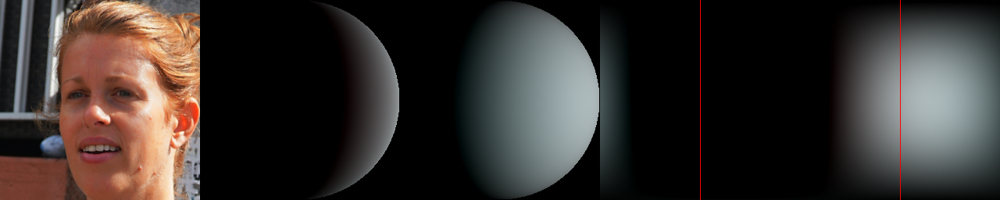

01000/01019.png
X: 0.8560658097267151, Y: -0.0965295359492302, Z: -0.27627015113830566
X: [0.8315662 0.8643294 0.8777737], Y: [-0.09673773 -0.0962789  -0.09727404], Z: [-0.27619913 -0.27408648 -0.2877004 ]


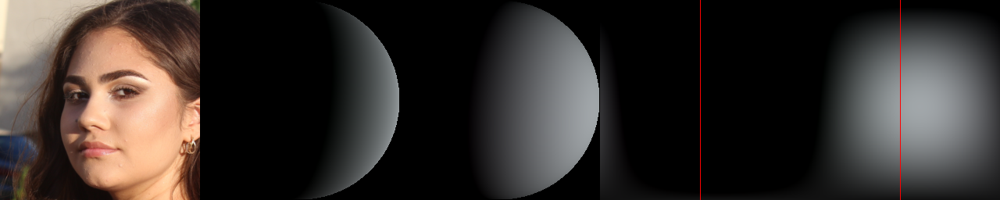

00000/00156.png
X: 0.7827669978141785, Y: 0.20501121878623962, Z: -0.4495176076889038
X: [0.7661132  0.78714347 0.80391145], Y: [0.19694707 0.20762546 0.21270086], Z: [-0.43427894 -0.457478   -0.44849676]


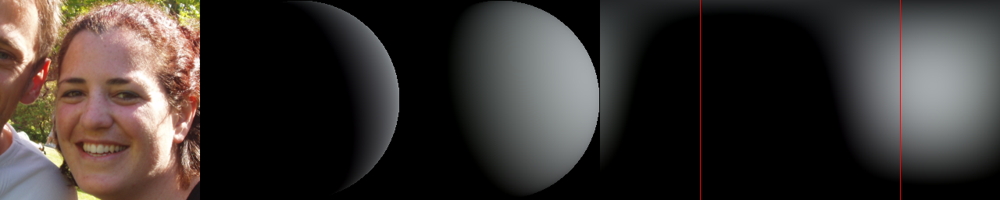

00000/00205.png
X: 0.7729838490486145, Y: 0.09827230870723724, Z: -0.2412463128566742
X: [0.7525273  0.77969193 0.7920964 ], Y: [0.09150018 0.10116583 0.10113522], Z: [-0.22364968 -0.24638084 -0.26096052]


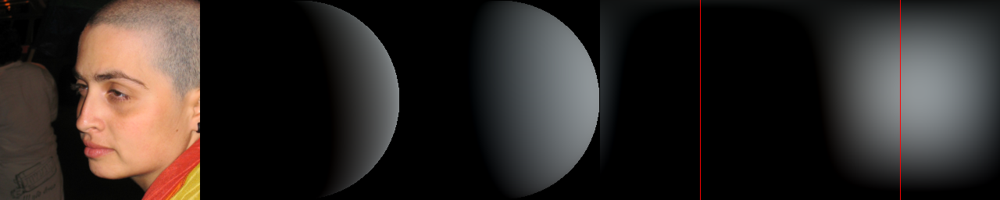

01000/01884.png
X: 0.7687636613845825, Y: 0.05317088961601257, Z: -0.5085589289665222
X: [0.75998294 0.77181804 0.7760659 ], Y: [0.05784231 0.05118445 0.05114705], Z: [-0.48580447 -0.5187695  -0.51566404]


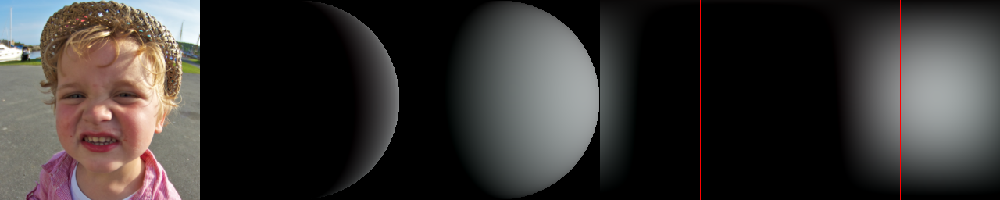

01000/01442.png
X: 0.7495266199111938, Y: 0.10445217788219452, Z: -0.2553538382053375
X: [0.7392528  0.7527076  0.76009387], Y: [0.10322692 0.10528093 0.10339843], Z: [-0.25105318 -0.25531417 -0.26683772]


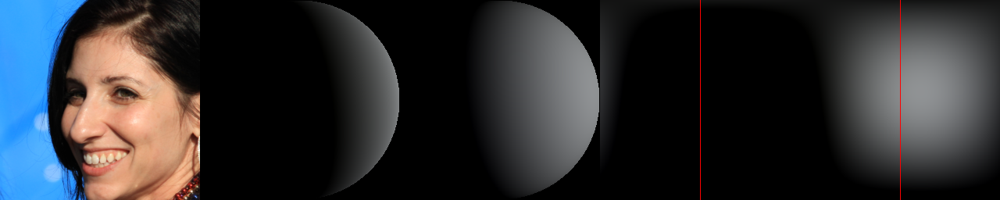

01000/01965.png
X: 0.7345867156982422, Y: 0.0213247612118721, Z: -0.4593576490879059
X: [0.7126838 0.7427188 0.7501605], Y: [0.01151765 0.0259368  0.023299  ], Z: [-0.38269904 -0.49030483 -0.50106716]


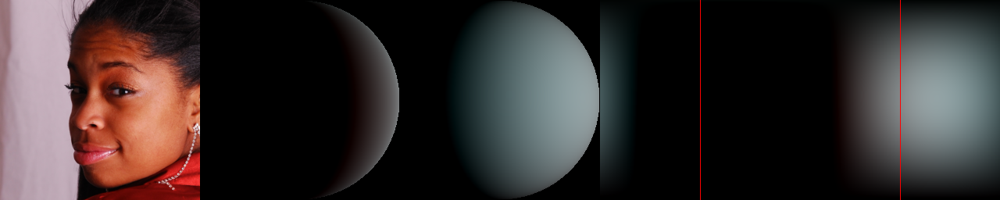

00000/00390.png
X: 0.7335549592971802, Y: -0.01054175291210413, Z: -0.404788613319397
X: [0.71376574 0.741131   0.7464484 ], Y: [-0.00936142 -0.01092085 -0.01168552], Z: [-0.3930321  -0.41225338 -0.39718652]


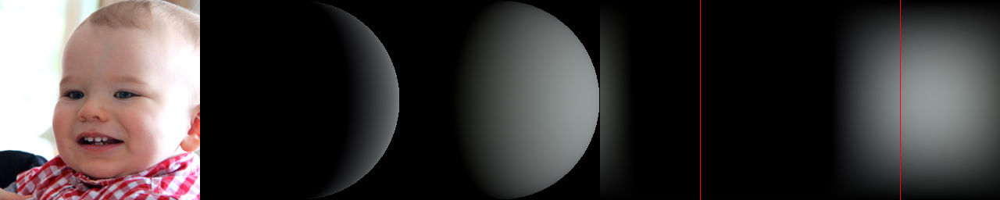

In [6]:
filenames = [
    "01000/01425",
    "00000/00321",
    "01000/01501",
    "01000/01019",
    "00000/00156",
    "00000/00205",
    "01000/01884",
    "01000/01442",
    "01000/01965",
    "00000/00390"
]
generate_face(filenames)

# Y - Minus

00000/00867.png
X: 0.26623740792274475, Y: -0.4424484670162201, Z: -0.4472450017929077
X: [0.25680953 0.26929855 0.27520284], Y: [-0.4340715  -0.44536936 -0.44937962], Z: [-0.4342405  -0.4521929  -0.45587593]


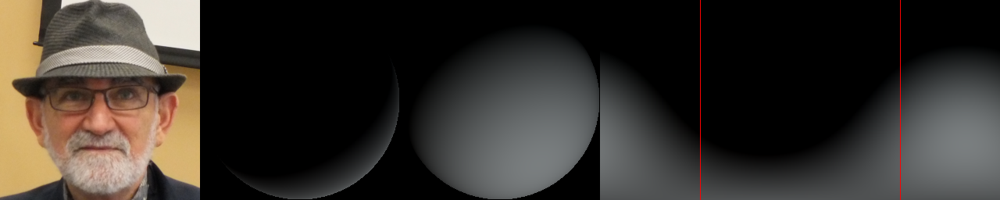

00000/00194.png
X: 0.3780409097671509, Y: -0.42634087800979614, Z: -0.44962412118911743
X: [0.35202476 0.38770333 0.39652342], Y: [-0.42533642 -0.4263679  -0.4288361 ], Z: [-0.4020193  -0.47140497 -0.46233034]


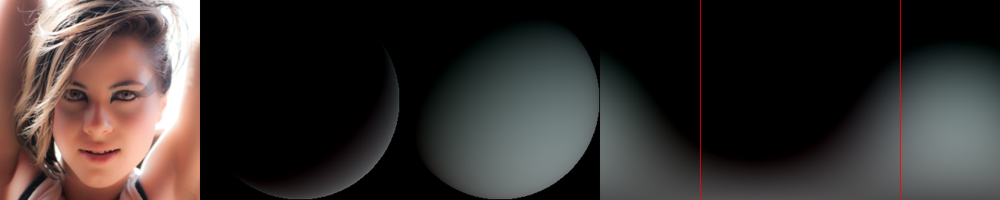

01000/01987.png
X: -0.0988115593791008, Y: -0.35412487387657166, Z: -0.3606705665588379
X: [-0.08503494 -0.10209662 -0.11802979], Y: [-0.3470601  -0.35708544 -0.35741   ], Z: [-0.35559162 -0.36962888 -0.3278643 ]


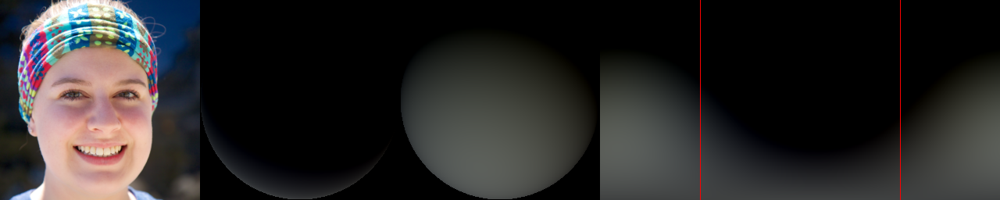

00000/00905.png
X: 0.03548561781644821, Y: -0.34487149119377136, Z: -0.3954683542251587
X: [0.04274458 0.03255802 0.03152137], Y: [-0.34177414 -0.34604287 -0.34696352], Z: [-0.37715575 -0.4080127  -0.3789066 ]


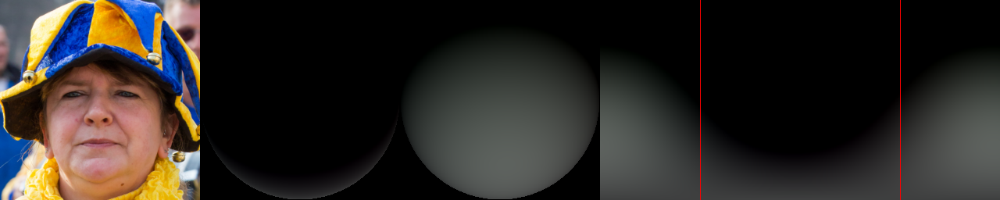

00000/00219.png
X: 0.5216968655586243, Y: -0.33208662271499634, Z: -0.3927256166934967
X: [0.4819637 0.5350502 0.5571513], Y: [-0.3289979  -0.33442837 -0.32812995], Z: [-0.4041845 -0.3850695 -0.4020937]


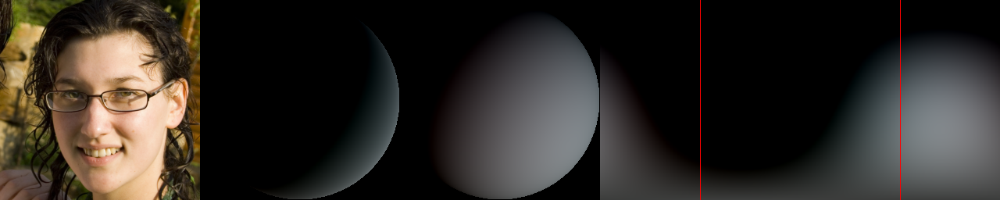

00000/00429.png
X: -0.28909924626350403, Y: -0.3173171877861023, Z: -0.3984667956829071
X: [-0.2793779  -0.29334736 -0.29272234], Y: [-0.31476346 -0.31894934 -0.31561077], Z: [-0.41643104 -0.39693514 -0.3592366 ]


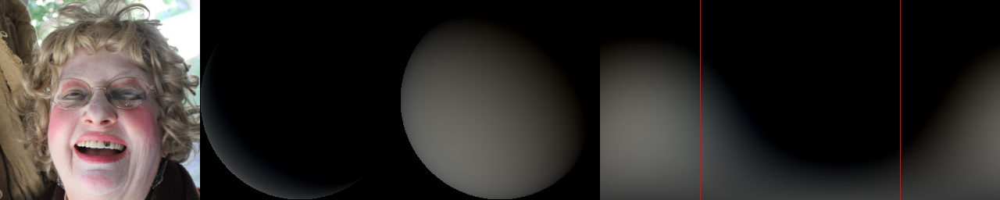

01000/01345.png
X: -0.3051149249076843, Y: -0.3157707750797272, Z: -0.5394160151481628
X: [-0.30871186 -0.30677697 -0.28712288], Y: [-0.3209557  -0.3127372  -0.31779203], Z: [-0.54893684 -0.54147613 -0.5038368 ]


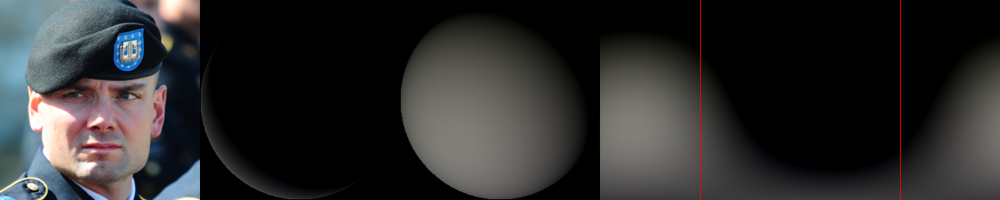

00000/00592.png
X: 0.4248667359352112, Y: -0.3138304650783539, Z: -0.2692326605319977
X: [0.40952155 0.42918763 0.44286555], Y: [-0.3147726  -0.3132395  -0.31440216], Z: [-0.2223795  -0.2828432  -0.32203716]


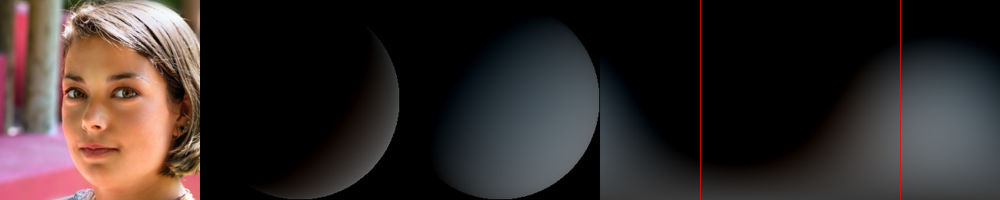

01000/01491.png
X: 0.26703155040740967, Y: -0.31319862604141235, Z: -0.2933388948440552
X: [0.25141123 0.27375945 0.27335793], Y: [-0.32185906 -0.30921566 -0.31099284], Z: [-0.31326842 -0.29090834 -0.25358284]


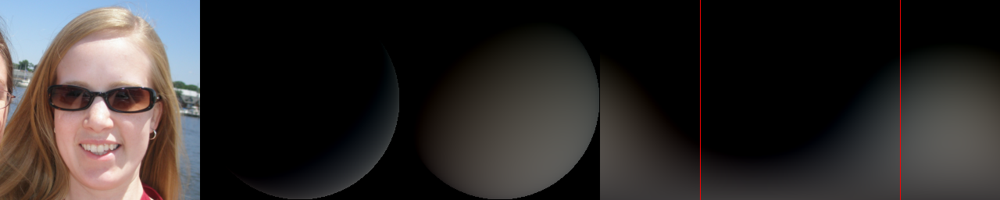

01000/01166.png
X: -0.2285812348127365, Y: -0.3065847158432007, Z: -0.2974785566329956
X: [-0.2137904  -0.23668684 -0.22563797], Y: [-0.29471838 -0.31107086 -0.31460804], Z: [-0.28113323 -0.30839428 -0.28414255]


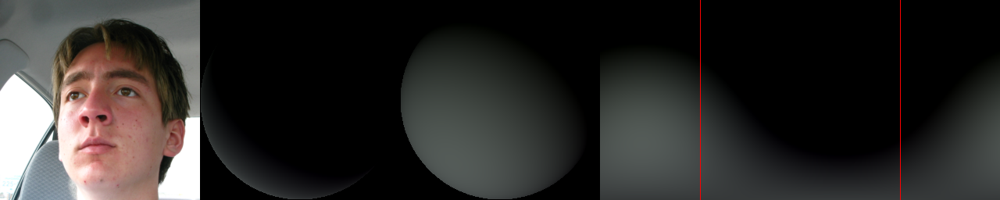

In [7]:
filenames = [
    "00000/00867",
    "00000/00194",
    "01000/01987",
    "00000/00905",
    "00000/00219",
    "00000/00429",
    "01000/01345",
    "00000/00592",
    "01000/01491",
    "01000/01166"
]
generate_face(filenames)

# Y-Plus

01000/01169.png
X: -0.15466172993183136, Y: 0.759273886680603, Z: -0.24788707494735718
X: [-0.12942733 -0.15906206 -0.19818886], Y: [0.74110556 0.76697624 0.7672654 ], Z: [-0.23766252 -0.26118463 -0.2062334 ]


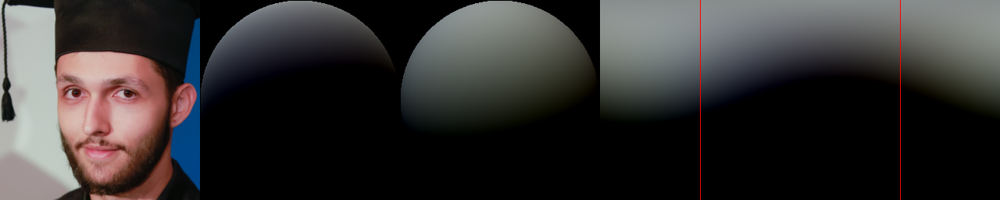

01000/01047.png
X: -0.11676143109798431, Y: 0.8723252415657043, Z: -0.20847608149051666
X: [-0.11627273 -0.11639568 -0.11992648], Y: [0.872635  0.8708082 0.8793239], Z: [-0.25960803 -0.19167715 -0.16086653]


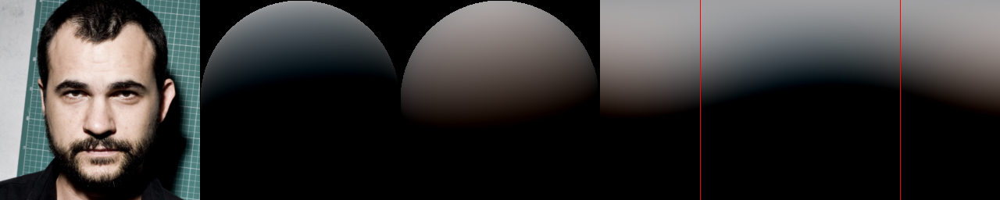

00000/00702.png
X: 0.06145661324262619, Y: 0.718411386013031, Z: -0.3800569176673889
X: [0.06987146 0.05924347 0.05078186], Y: [0.70419025 0.72469944 0.72333264], Z: [-0.33255342 -0.39986154 -0.4026729 ]


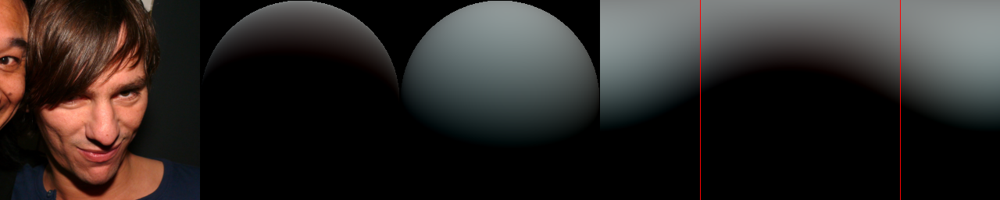

01000/01346.png
X: -0.09305630624294281, Y: 0.7149951457977295, Z: -0.22353002429008484
X: [-0.09020148 -0.09333146 -0.09912719], Y: [0.70621264 0.71922874 0.71623063], Z: [-0.21986157 -0.2290825  -0.20456131]


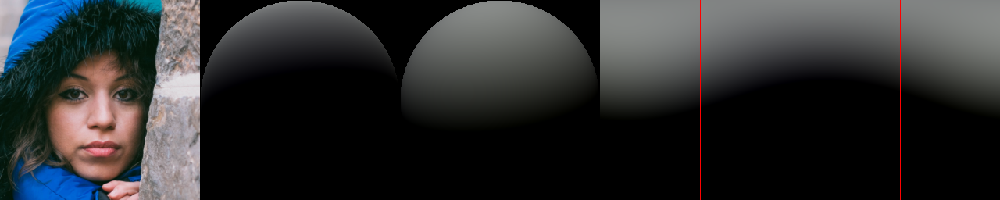

01000/01949.png
X: 0.08142124861478806, Y: 0.6927463412284851, Z: -0.153105229139328
X: [0.08400457 0.08242663 0.06946886], Y: [0.682638   0.69776326 0.69342595], Z: [-0.19071832 -0.14620419 -0.08998759]


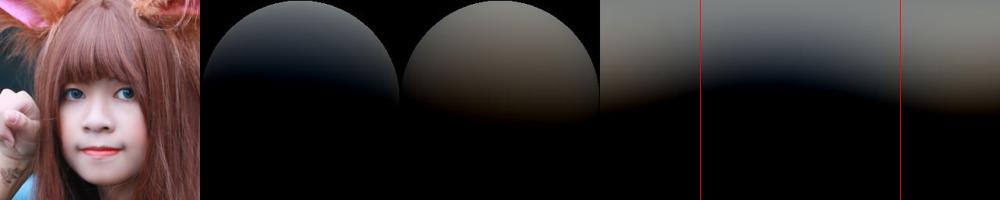

01000/01605.png
X: -0.027273721992969513, Y: 0.6771969199180603, Z: -0.17736025154590607
X: [-0.02029192 -0.02964358 -0.03338294], Y: [0.66705203 0.681874   0.67972237], Z: [-0.17224163 -0.18275988 -0.162982  ]


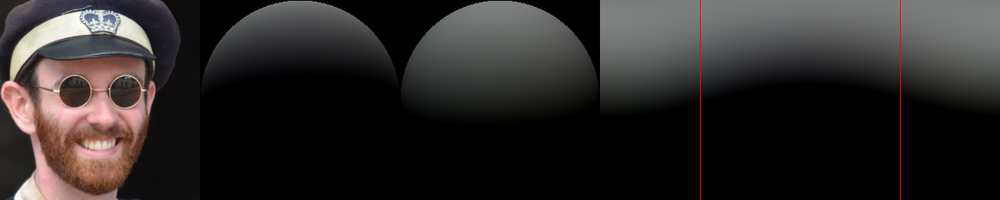

01000/01770.png
X: -0.20905525982379913, Y: 0.6735150814056396, Z: -0.27323853969573975
X: [-0.20733319 -0.21087636 -0.20419492], Y: [0.664478  0.6770604 0.6789622], Z: [-0.25191838 -0.2722775  -0.33410573]


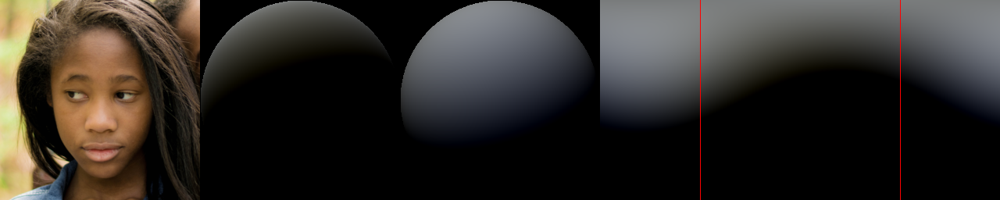

01000/01012.png
X: -0.19852326810359955, Y: 0.6573584079742432, Z: -0.3867485523223877
X: [-0.17627148 -0.20581155 -0.21935713], Y: [0.6402829  0.6639798  0.66804934], Z: [-0.34487376 -0.40003508 -0.428164  ]


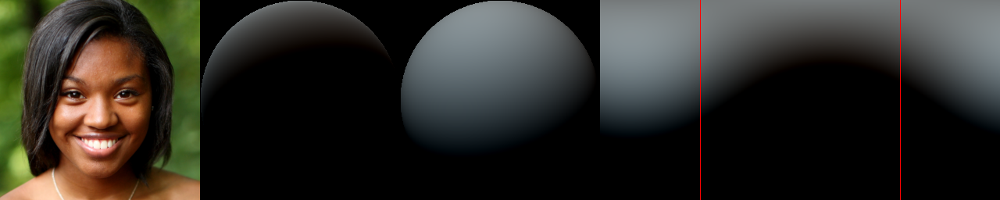

00000/00574.png
X: 0.0474603995680809, Y: 0.6568005084991455, Z: -0.2835375964641571
X: [0.05010181 0.04780153 0.03877598], Y: [0.6386653  0.66532564 0.6604689 ], Z: [-0.24559125 -0.29830986 -0.3069992 ]


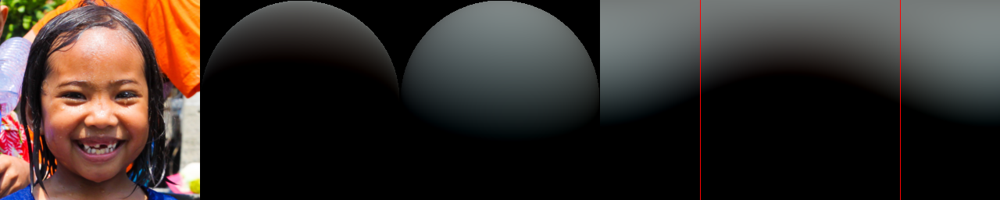

01000/01603.png
X: 0.2514754831790924, Y: 0.6425445079803467, Z: -0.1782236099243164
X: [0.23858233 0.25565463 0.2637727 ], Y: [0.6294857 0.6475475 0.6510344], Z: [-0.19523206 -0.17195036 -0.16591536]


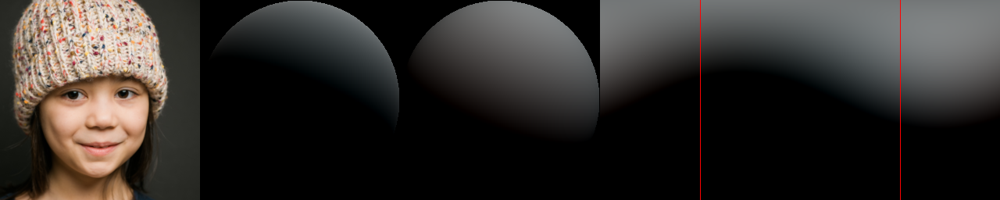

In [8]:
filenames = [
    "01000/01169",
    "01000/01047",
    "00000/00702",
    "01000/01346",
    "01000/01949",
    "01000/01605",
    "01000/01770",
    "01000/01012",
    "00000/00574",
    "01000/01603"
]
generate_face(filenames)

# Z-Minus

01000/01338.png
X: -0.023586899042129517, Y: 0.1875912845134735, Z: -0.8482257723808289
X: [-0.01714916 -0.02715572 -0.02209553], Y: [0.18472718 0.18814608 0.19224654], Z: [-0.8078115 -0.8607816 -0.8895725]


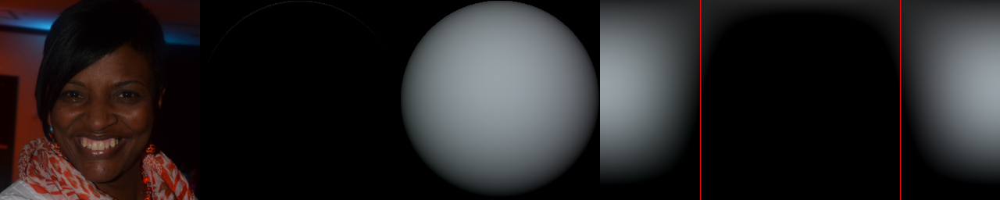

00000/00963.png
X: -0.12777255475521088, Y: 0.20655764639377594, Z: -0.8022642731666565
X: [-0.12216084 -0.12933584 -0.13444147], Y: [0.20740849 0.20661771 0.20401675], Z: [-0.7977359  -0.80686784 -0.7904365 ]


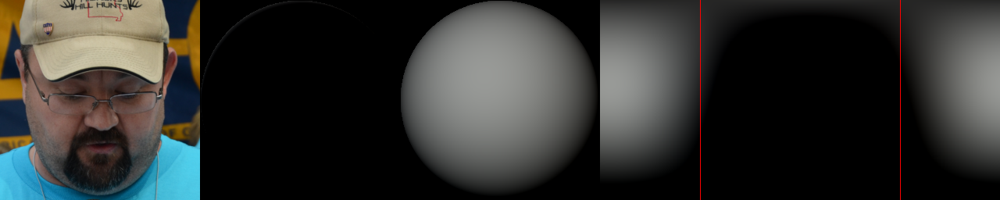

01000/01994.png
X: 0.11918166279792786, Y: 0.20573440194129944, Z: -0.8014296889305115
X: [0.11714138 0.1202836  0.11885883], Y: [0.19652903 0.20952347 0.21036792], Z: [-0.7662394 -0.8143905 -0.8269906]


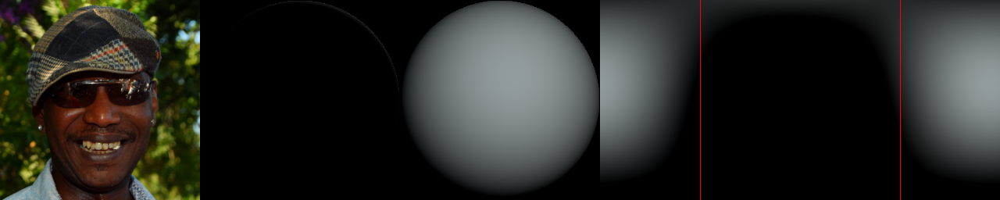

00000/00046.png
X: 0.06755055487155914, Y: 0.4514511227607727, Z: -0.792709231376648
X: [0.06152033 0.06926574 0.07453497], Y: [0.44485524 0.45390847 0.45609796], Z: [-0.7982234  -0.79825974 -0.7496662 ]


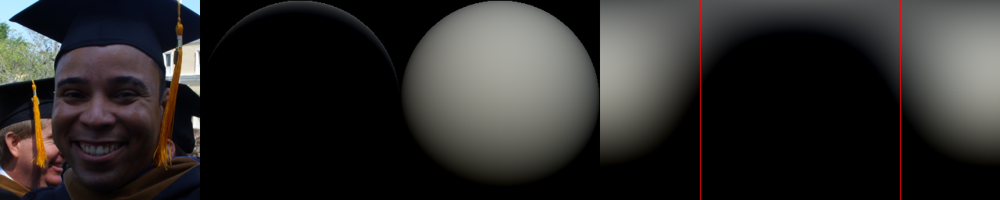

00000/00902.png
X: 0.0303946640342474, Y: 0.22746102511882782, Z: -0.7911278009414673
X: [0.03541271 0.0288069  0.02540888], Y: [0.23022142 0.22724144 0.22135167], Z: [-0.80091214 -0.79001635 -0.77118844]


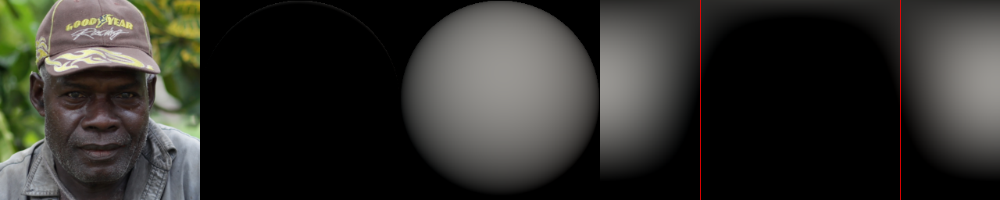

00000/00375.png
X: 0.3522053360939026, Y: 0.39213326573371887, Z: -0.7771682739257812
X: [0.3503729  0.35214743 0.3573095 ], Y: [0.37648588 0.39800197 0.40295464], Z: [-0.6976398  -0.8050019  -0.84243685]


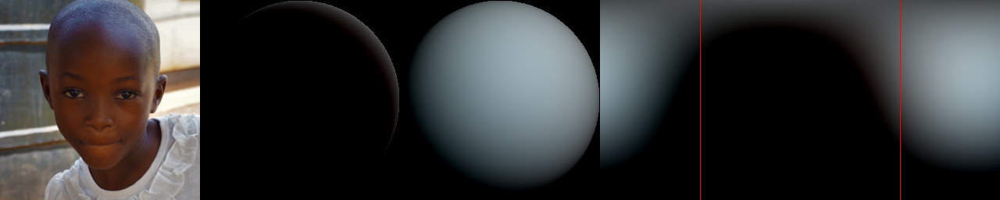

01000/01063.png
X: -0.062000375241041183, Y: 0.16011187434196472, Z: -0.7666552066802979
X: [-0.06449678 -0.05986534 -0.06644633], Y: [0.14827362 0.16544594 0.16369553], Z: [-0.712239   -0.7857922  -0.81083983]


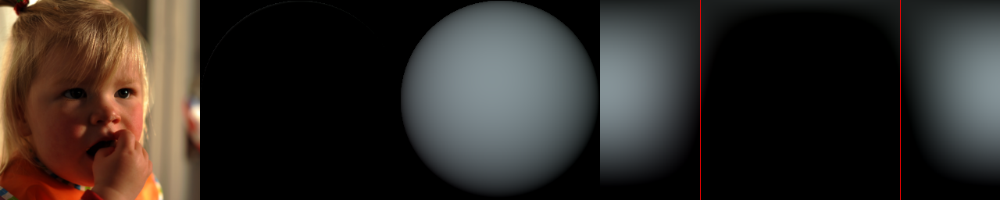

00000/00600.png
X: 0.01618720404803753, Y: 0.09783201664686203, Z: -0.7540740966796875
X: [0.02566618 0.01164813 0.01469793], Y: [0.09922181 0.09802201 0.09320854], Z: [-0.7053151 -0.7746749 -0.7758833]


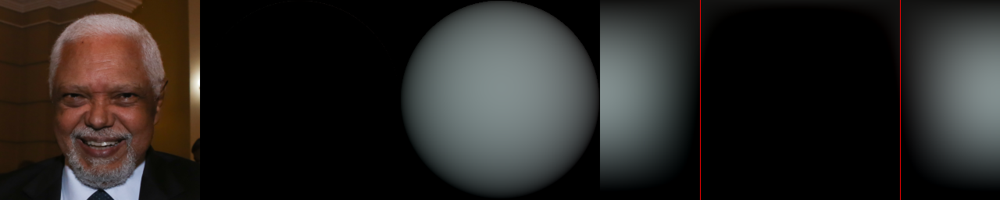

00000/00124.png
X: -0.010443544015288353, Y: 0.3464525043964386, Z: -0.7533402442932129
X: [-0.00932616 -0.00974168 -0.01698821], Y: [0.33524752 0.35092297 0.35282218], Z: [-0.71614444 -0.7691359  -0.769564  ]


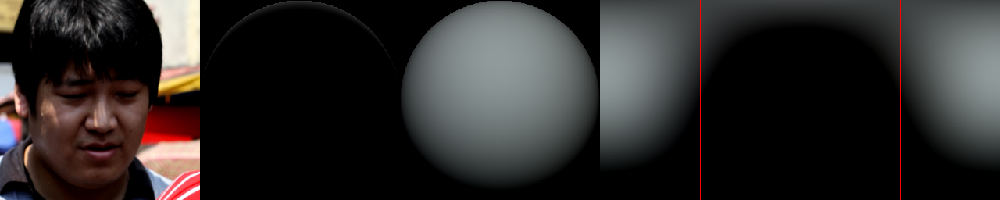

01000/01304.png
X: 0.16625583171844482, Y: 0.04033220559358597, Z: -0.729009747505188
X: [0.1663815  0.16485037 0.17316307], Y: [0.03492479 0.04295306 0.0410197 ], Z: [-0.63970375 -0.76428366 -0.7816124 ]


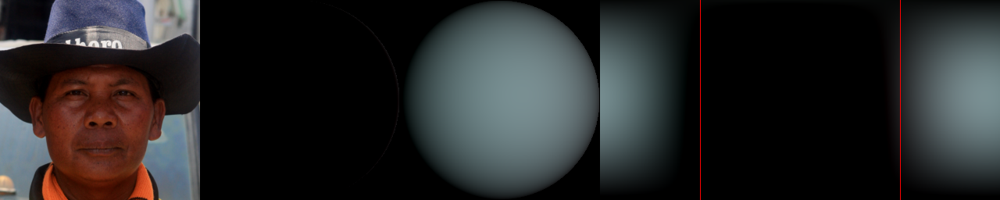

In [9]:
filenames = [
    "01000/01338",
    "00000/00963",
    "01000/01994",
    "00000/00046",
    "00000/00902",
    "00000/00375",
    "01000/01063",
    "00000/00600",
    "00000/00124",
    "01000/01304"
]
generate_face(filenames)

# Z-Plus

01000/01200.png
X: -0.34769442677497864, Y: -0.038458939641714096, Z: 0.029795829206705093
X: [-0.30509862 -0.36450988 -0.37283024], Y: [-0.0263496  -0.04280001 -0.04786672], Z: [0.00916239 0.03562082 0.05391978]


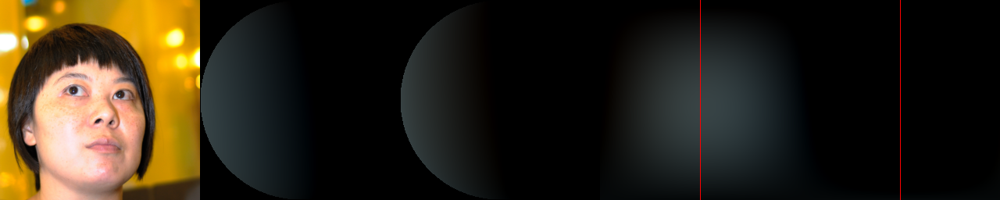

00000/00033.png
X: -0.31015655398368835, Y: 0.008712138049304485, Z: 0.04411756247282028
X: [-0.29520333 -0.31622246 -0.31814194], Y: [0.00936025 0.00931122 0.0039275 ], Z: [-0.04375783  0.07776704  0.10133246]


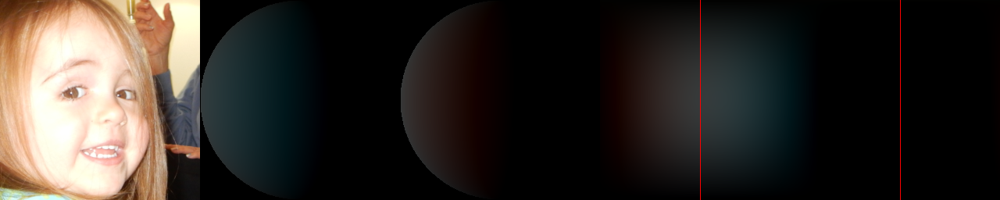

00000/00673.png
X: 0.19130221009254456, Y: 0.32407575845718384, Z: -0.0031797345727682114
X: [0.18227194 0.19534963 0.19414622], Y: [0.30615774 0.33097368 0.33555293], Z: [-0.01785065  0.01188985 -0.0422959 ]


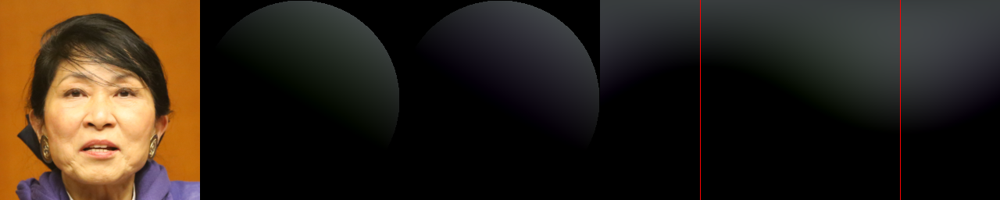

01000/01525.png
X: 0.08496542274951935, Y: 0.19049617648124695, Z: -0.02030365914106369
X: [0.08124707 0.08673078 0.08562788], Y: [0.1799876  0.19431627 0.19838811], Z: [-0.00497052 -0.01907305 -0.06685609]


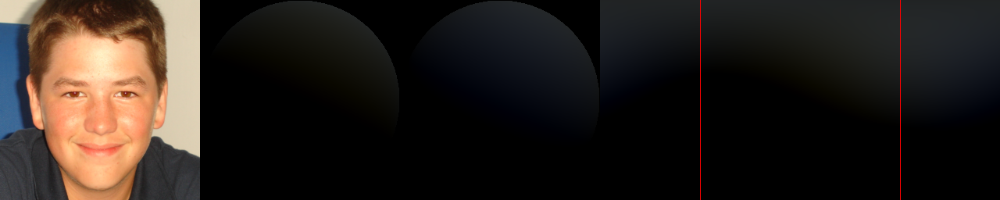

00000/00032.png
X: 0.2665022015571594, Y: -0.02916935831308365, Z: -0.03129717707633972
X: [0.24888268 0.2731469  0.27850038], Y: [-0.03154641 -0.02783825 -0.02978886], Z: [-0.11123471 -0.003493    0.03519639]


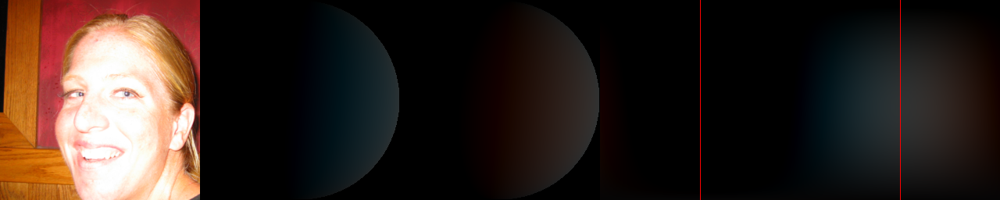

01000/01455.png
X: -0.12524941563606262, Y: -0.01722603291273117, Z: -0.038684722036123276
X: [-0.11783773 -0.12641959 -0.13866341], Y: [-0.00856634 -0.01943524 -0.02856323], Z: [-0.132711   -0.01097681  0.06525655]


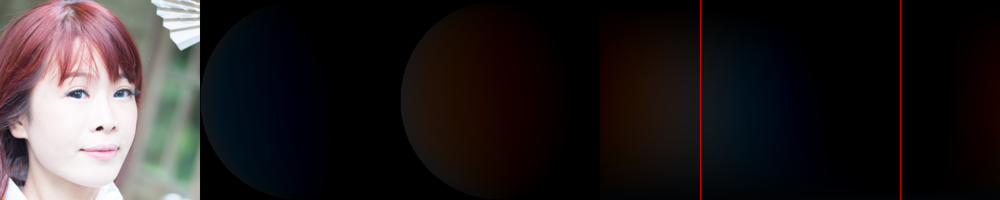

01000/01315.png
X: 0.04579487442970276, Y: 0.1981838047504425, Z: -0.03996647894382477
X: [0.0391208  0.05049971 0.0390739 ], Y: [0.1875142  0.2043052  0.19464837], Z: [-0.00842836 -0.04220018 -0.1111833 ]


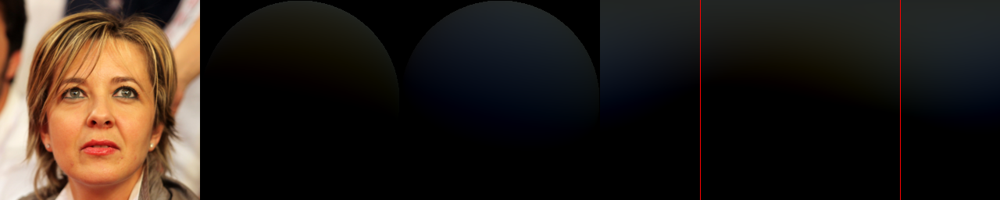

01000/01661.png
X: 0.23076298832893372, Y: 0.17245186865329742, Z: -0.04013547673821449
X: [0.22471435 0.23119907 0.24438196], Y: [0.17126828 0.17385569 0.16832764], Z: [-0.02066797 -0.05282097 -0.02587582]


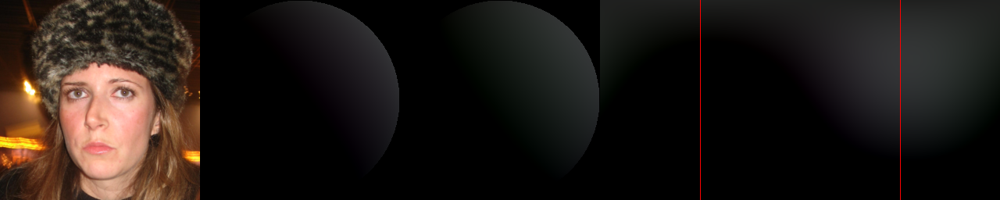

00000/00502.png
X: -0.26016098260879517, Y: 0.1614075005054474, Z: -0.041732851415872574
X: [-0.2142543  -0.2783226  -0.28704882], Y: [0.16789122 0.15976427 0.15286313], Z: [-0.07436256 -0.03113559 -0.01071802]


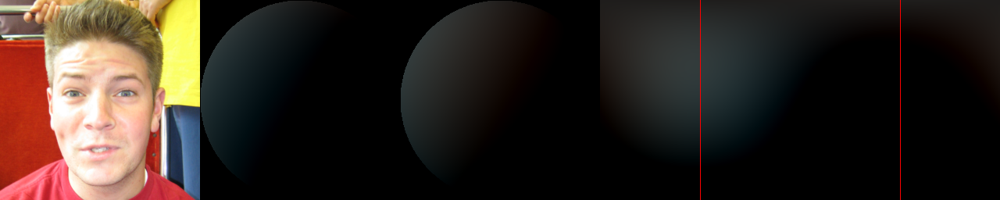

01000/01397.png
X: 0.012201684527099133, Y: 0.05824894458055496, Z: -0.04666532576084137
X: [0.01466499 0.01118833 0.01095878], Y: [0.05729332 0.05889743 0.05741619], Z: [-0.12631097 -0.01852188  0.01731577]


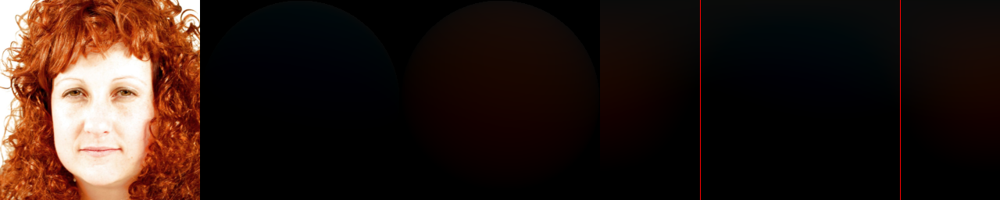

In [11]:
filenames = [
    "01000/01200",
    "00000/00033",
    "00000/00673",
    "01000/01525",
    "00000/00032",
    "01000/01455",
    "01000/01315",
    "01000/01661",
    "00000/00502",
    "01000/01397"
]
generate_face(filenames)